In [1]:
import os
import copy
import opendssdirect as dss 
import networkx as nx
import numpy as np
import math
import pandas as pd
from geopy.distance import geodesic
# from DSS_CircuitSetup import *
import osmnx as ox
import pickle
import matplotlib.pyplot as plt
from IPython.display import Image
from gurobipy import Model, GRB, quicksum

import time

In [2]:
with open('TrasportNetGraph.gpickle', 'rb') as f:          # to load graph
    G = pickle.load(f) 

df_GPrim_coord = pd.read_excel("GPrim_coord.xlsx")

In [3]:
# Image(filename='8500CircuitPlot.jpg', width=500)

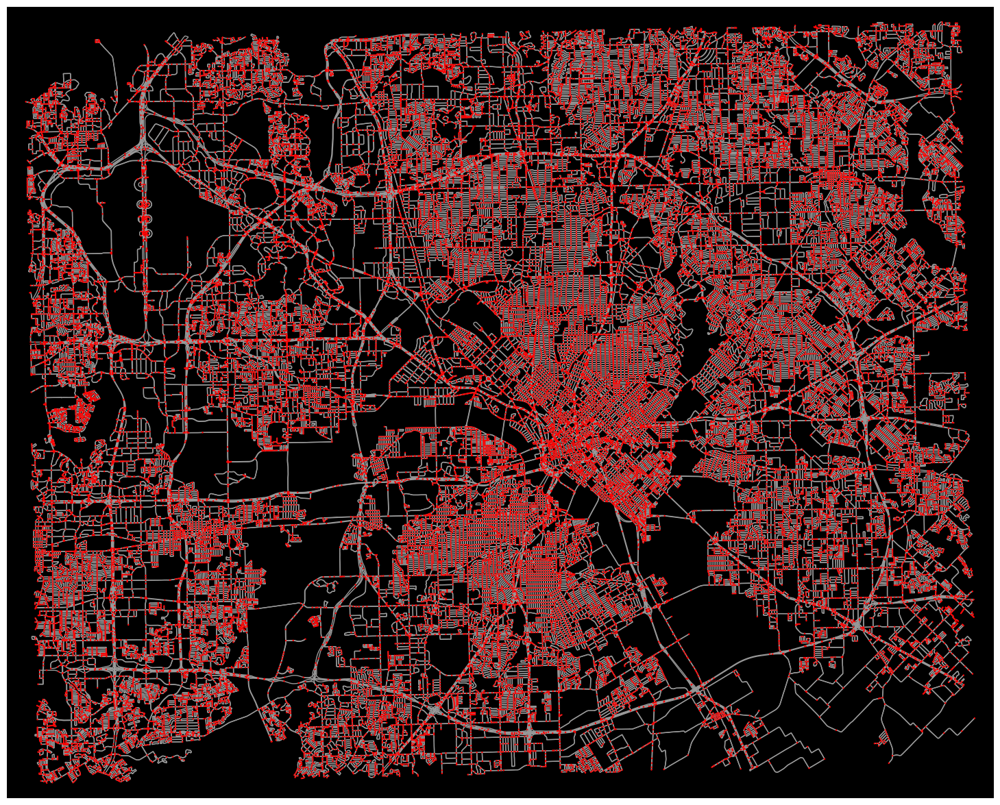

In [4]:
fig, ax = ox.plot_graph(G, node_color = "red", node_size = 3, show = False,\
                        close = False, figsize = (21, 15), bgcolor='black')
# fig.savefig('transport_network.png', bbox_inches = 'tight')

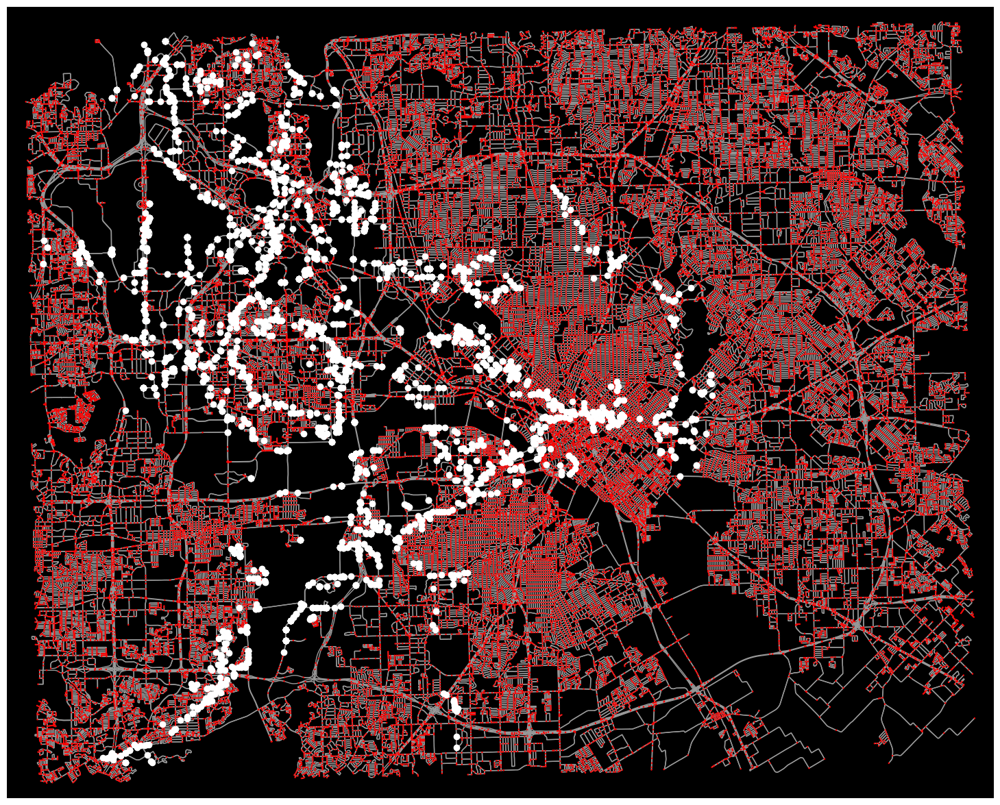

In [5]:
fig, ax = ox.plot_graph(G, node_color = "red", node_size = 3, show = False,\
                        close = False, figsize = (21, 15), bgcolor='black')

for i in df_GPrim_coord['closest_node_osmid']:
    ax.scatter(G.nodes[i]['x'], G.nodes[i]['y'], c='white', marker='o', s = 36)

# fig.savefig('transport_network2.png', bbox_inches = 'tight')

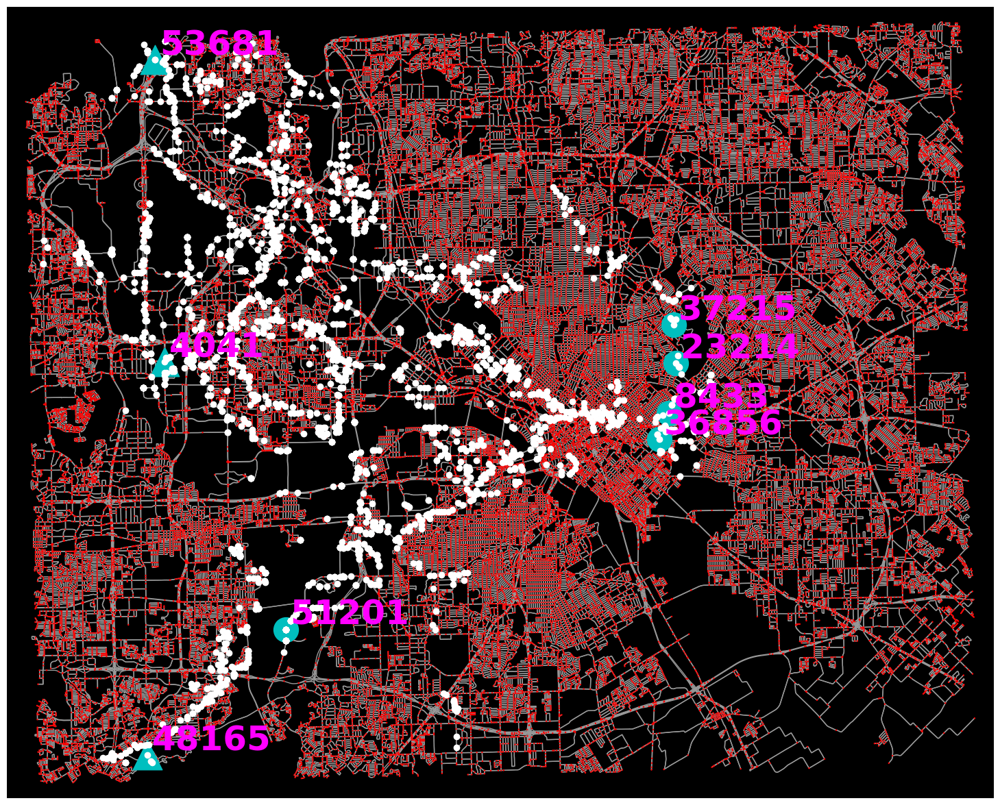

In [6]:
fig, ax = plt.subplots(figsize = (21, 15))
ax.set_facecolor('black')  # Set background color to black
ox.plot_graph(G, node_color = "r", node_size = 3, show = False, close = False, ax = ax)

depot1 = 53681
depot2 = 4041
depot3 = 48165
fail1 = 37215
fail2 = 23214
fail3 = 8433
fail4 = 36856
fail5 = 51201

ax.scatter(G.nodes[depot1]['x'], G.nodes[depot1]['y'], c='c', marker='^', s = 939)
ax.text(G.nodes[depot1]['x'] + 252, G.nodes[depot1]['y'] + 252, f'{depot1}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[depot2]['x'], G.nodes[depot2]['y'], c='c', marker='^', s = 939)
ax.text(G.nodes[depot2]['x'] + 252, G.nodes[depot2]['y'] + 252, f'{depot2}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[depot3]['x'], G.nodes[depot3]['y'], c='c', marker='^', s = 939)
ax.text(G.nodes[depot3]['x'] + 252, G.nodes[depot3]['y'] + 252, f'{depot3}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail1]['x'], G.nodes[fail1]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail1]['x'] + 252, G.nodes[fail1]['y'] + 252, f'{fail1}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail2]['x'], G.nodes[fail2]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail2]['x'] + 252, G.nodes[fail2]['y'] + 252, f'{fail2}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail3]['x'], G.nodes[fail3]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail3]['x'] + 252, G.nodes[fail3]['y'] + 252, f'{fail3}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail4]['x'], G.nodes[fail4]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail4]['x'] + 252, G.nodes[fail4]['y'] + 252, f'{fail4}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail5]['x'], G.nodes[fail5]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail5]['x'] + 252, G.nodes[fail5]['y'] + 252, f'{fail5}', fontsize = 36, color = 'magenta', weight='bold')

for i in df_GPrim_coord['closest_node_osmid']:
    ax.scatter(G.nodes[i]['x'], G.nodes[i]['y'], c='white', marker='o', s = 36)
    
# fig.savefig('DFW_8500_selected_nodes.png', bbox_inches = 'tight')

In [7]:
shortest_path_lengths = {}
shortest_path_routes = {}
routes = []
nodes_list = [depot1, depot2, depot3, fail1, fail2, fail3, fail4, fail5]
for i in nodes_list:
    for j in nodes_list: 
        if i != j:
            route = ox.shortest_path(G, i, j, weight = "length")
            shortest_path_length = sum(ox.utils_graph.get_route_edge_attributes(G, route, "length"))
            shortest_path_lengths[(i, j)] = shortest_path_length 
            shortest_path_routes[(i, j)] = route
            routes.append(route)

C:\Users\HXK230065\AppData\Local\Temp\ipykernel_4532\4066077318.py:9: FutureWarning: The `get_route_edge_attributes` function has been deprecated and will be removed in the v2.0.0 release. Use the `route_to_gdf` function instead.
  shortest_path_length = sum(ox.utils_graph.get_route_edge_attributes(G, route, "length"))


Text(691196.0181879943, 3619586.70932944, '51201')

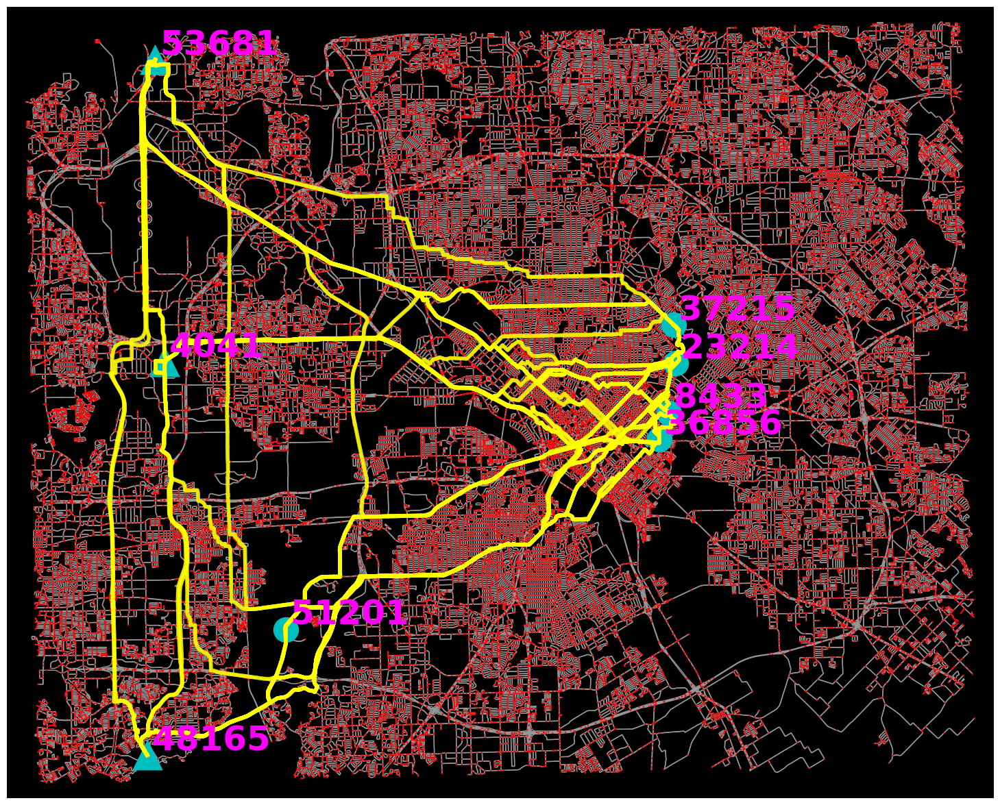

In [8]:
fig, ax = ox.plot_graph(G, node_color = "red", node_size = 3, show = False,\
                        close = False, figsize = (21, 15), bgcolor='black')

# Plot the graph routes with specified parameters
# ox.plot_graph_routes(G, routes, route_colors = "magenta", route_linewidth = 10, \
#                      node_color = "r", node_size = 6, ax = ax, show = False, close = False)

for offset in np.linspace(-1, 1, 3):
    ox.plot_graph_routes(G, routes, route_colors="yellow", route_linewidth=10, \
                         node_color="r", node_size=6, ax=ax, show=False, close=False, offset=offset)


ax.scatter(G.nodes[depot1]['x'], G.nodes[depot1]['y'], c ='c', marker='^', s = 939)
ax.text(G.nodes[depot1]['x'] + 252, G.nodes[depot1]['y'] + 252, f'{depot1}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[depot2]['x'], G.nodes[depot2]['y'], c='c', marker='^', s = 939)
ax.text(G.nodes[depot2]['x'] + 252, G.nodes[depot2]['y'] + 252, f'{depot2}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[depot3]['x'], G.nodes[depot3]['y'], c='c', marker='^', s = 939)
ax.text(G.nodes[depot3]['x'] + 252, G.nodes[depot3]['y'] + 252, f'{depot3}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail1]['x'], G.nodes[fail1]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail1]['x'] + 252, G.nodes[fail1]['y'] + 252, f'{fail1}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail2]['x'], G.nodes[fail2]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail2]['x'] + 252, G.nodes[fail2]['y'] + 252, f'{fail2}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail3]['x'], G.nodes[fail3]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail3]['x'] + 252, G.nodes[fail3]['y'] + 252, f'{fail3}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail4]['x'], G.nodes[fail4]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail4]['x'] + 252, G.nodes[fail4]['y'] + 252, f'{fail4}', fontsize = 36, color = 'magenta', weight='bold')

ax.scatter(G.nodes[fail5]['x'], G.nodes[fail5]['y'], c='c', marker='o', s = 669)
ax.text(G.nodes[fail5]['x'] + 252, G.nodes[fail5]['y'] + 252, f'{fail5}', fontsize = 36, color = 'magenta', weight='bold')

# for i in df_GPrim_coord['closest_node_osmid']:
#     ax.scatter(G.nodes[i]['x'], G.nodes[i]['y'], c='blue', marker='o', s = 18)

# fig.savefig('DFW_8500_selected_nodes_ShortestPaths.png', bbox_inches = 'tight')

# plt.show()


{53681: Text(3.0, -1.9008994887963464, '53681'),
 4041: Text(0.9011042872616806, -1.860898553464203, '4041'),
 48165: Text(-1.7085485110722758, -2.8143362015306037, '48165'),
 37215: Text(0.37085665872427337, 1.945973111691569, '37215'),
 23214: Text(0.0636677629377122, 1.7758689846305107, '23214'),
 8433: Text(-0.3433233006620946, 1.8014653195170425, '8433'),
 36856: Text(-0.5054077551507716, 1.575436001624167, '36856'),
 51201: Text(-1.7783491420385238, -1.2426091736721365, '51201')}

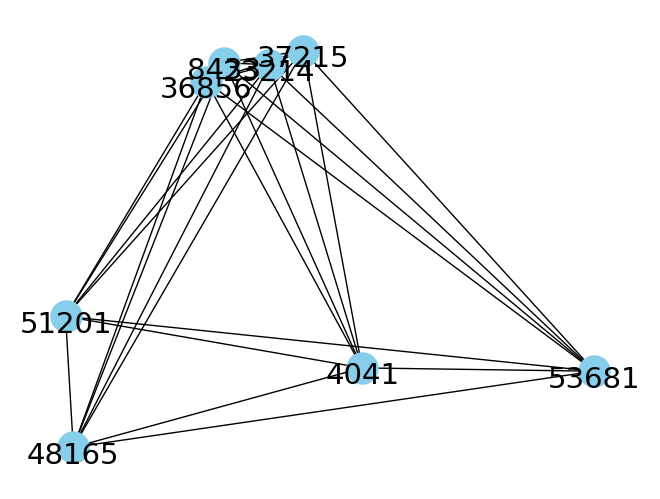

In [9]:
G_complete = nx.Graph()
for (node1, node2), weight in shortest_path_lengths.items():
    G_complete.add_edge(node1, node2, weight = weight)
    
# pos = nx.kamada_kawai_layout(G_complete, scale = 10)
# nx.draw(G_complete, pos, with_labels=True, node_size=500, node_color='skyblue', font_size=21, font_color='black')


pos = nx.kamada_kawai_layout(G_complete, scale=3)

pos_labels = {node: (x, y -0.09) for node, (x, y) in pos.items()}

nx.draw(G_complete, pos, with_labels=False, node_size=500, node_color='skyblue', font_size=21, font_color='black')
nx.draw_networkx_labels(G_complete, pos_labels, font_size = 21,font_color='black')



# plt.savefig('DFW_8500_completeG.png')


In [10]:
def routes_plot_func(nodes_list, shortest_path_routes, active_arcs, itr):
    
    routes_CVRP = []
    for arc in active_arcs:
        routes_CVRP.append(shortest_path_routes[arc])

    fig, ax = ox.plot_graph(G, node_color = "red", node_size = 3, show = False,\
                            close = False, figsize = (21, 15), bgcolor='black')

    depot1 = nodes_list[0]
    depot2 = nodes_list[1]
    depot3 = nodes_list[2]
    fail1 = nodes_list[3]
    fail2 = nodes_list[4]
    fail3 = nodes_list[5]
    fail4 = nodes_list[6]
    fail5 = nodes_list[7]
#     dest = nodes_list[8]

    for offset in np.linspace(-1, 1, 3):
        ox.plot_graph_routes(G, routes_CVRP, route_colors="yellow", route_linewidth=10, \
                             node_color="r", node_size=3, ax=ax, show=False, close=False, offset=offset)

    ax.scatter(G.nodes[depot1]['x'], G.nodes[depot1]['y'], c ='c', marker='^', s = 939)
    ax.text(G.nodes[depot1]['x'] + 252, G.nodes[depot1]['y'] + 252, f'{depot1}', fontsize = 36, color = 'magenta', weight='bold')

    ax.scatter(G.nodes[depot2]['x'], G.nodes[depot2]['y'], c='c', marker='^', s = 939)
    ax.text(G.nodes[depot2]['x'] + 252, G.nodes[depot2]['y'] + 252, f'{depot2}', fontsize = 36, color = 'magenta', weight='bold')

    ax.scatter(G.nodes[depot3]['x'], G.nodes[depot3]['y'], c='c', marker='^', s = 939)
    ax.text(G.nodes[depot3]['x'] + 252, G.nodes[depot3]['y'] + 252, f'{depot3}', fontsize = 36, color = 'magenta', weight='bold')

    ax.scatter(G.nodes[fail1]['x'], G.nodes[fail1]['y'], c='c', marker='o', s = 669)
    ax.text(G.nodes[fail1]['x'] + 252, G.nodes[fail1]['y'] + 252, f'{fail1}', fontsize = 36, color = 'magenta', weight='bold')

    ax.scatter(G.nodes[fail2]['x'], G.nodes[fail2]['y'], c='c', marker='o', s = 669)
    ax.text(G.nodes[fail2]['x'] + 252, G.nodes[fail2]['y'] + 252, f'{fail2}', fontsize = 36, color = 'magenta', weight='bold')

    ax.scatter(G.nodes[fail3]['x'], G.nodes[fail3]['y'], c='c', marker='o', s = 669)
    ax.text(G.nodes[fail3]['x'] + 252, G.nodes[fail3]['y'] + 252, f'{fail3}', fontsize = 36, color = 'magenta', weight='bold')

    ax.scatter(G.nodes[fail4]['x'], G.nodes[fail4]['y'], c='c', marker='o', s = 669)
    ax.text(G.nodes[fail4]['x'] + 252, G.nodes[fail4]['y'] + 252, f'{fail4}', fontsize = 36, color = 'magenta', weight='bold')

    ax.scatter(G.nodes[fail5]['x'], G.nodes[fail5]['y'], c='c', marker='o', s = 669)
    ax.text(G.nodes[fail5]['x'] + 252, G.nodes[fail5]['y'] + 252, f'{fail5}', fontsize = 36, color = 'magenta', weight='bold')
       
    plt.show()
    
#     plt.savefig(f"Final_paths_iter_{itr}.pdf", bbox_inches = 'tight')
#     plt.savefig('Final_paths_iter__.pdf', bbox_inches = 'tight')

In [11]:
failed_node_dict = {fail1: 'm1209822', fail2: 'l2936216', fail3: 'l2823611', fail4: 'l3139366', fail5: 'l2785527'}
N = [fail1, fail2, fail3, fail4, fail5]

In [12]:
# Define mu and sigma
def Repair_time_Power_restored(N):
    mu, sigma = -0.3072, 1.8404
    Repair_time_dict_old = {}
    for node in N:
        sample_t = np.random.lognormal(mu, sigma)

        # Truncate unreasonable values like 0.01
        while sample_t < 1:
            sample_t = np.random.lognormal(mu, sigma)

        # Add to dictionary
        Repair_time_dict_old[node] = sample_t

    %run "powerRestored\PowerNetwork_Graph_Final.ipynb"

    return Repair_time_dict_old, Power_restored_dict_old

In [13]:
[Repair_time_dict_old, Power_restored_dict_old] = Repair_time_Power_restored(N)

[('m1209822', 'm1209823')]
[('m1209819', 'l2936216')]
[('m1209787', 'l2823611')]
[('l3139366', 'm4362177')]
[('l2785527', 'l2766729')]


In [14]:
Power_restored_dict = {}

for key, value in failed_node_dict.items():
    Power_restored_dict[key] = Power_restored_dict_old[value]

In [15]:
Repair_time_dict = {}
for key, value in Repair_time_dict_old.items():
    Repair_time_dict[key] = (1000 - value)/100

In [16]:
rnd = np.random
rnd.seed(0)

n = len(nodes_list) - 2                         # total node points (includes the depots)

N = [fail1, fail2, fail3, fail4, fail5]         # all the failed nodes (excluding the start and end depot)

V = [depot1, depot2, depot3] + N                # total failed nodes and depots

A = [(i, j) for i in V for j in V if i != j]    # edge-list construction
A.remove((depot1, depot2))
A.remove((depot1, depot3))
A.remove((depot2, depot1))
A.remove((depot2, depot3))
A.remove((depot3, depot1))
A.remove((depot3, depot2))

# B = []
# for i, j in A:
#     if i != dest and j != orig:
#         B.append((i, j))

B = A
        
c = {(i, j): shortest_path_lengths[(i, j)] 
     for i, j in B}                             # cost matrix

Q = 15                                          # capacity of a vehicle

q = {i: rnd.randint(1, 10) for i in N}          # random demand at a node

In [17]:
def Resource_allocation(N, q_rem, Q, Repair_time_dict_RA, Power_restored_dict_RA):
    
    mdl1 = Model('Resource_Allocation')

    x_q = mdl1.addVars(N, vtype = GRB.CONTINUOUS)        # Continuous decision variable to allocate resources of crew
    # y = mdl1.addVars(N, vtype = GRB.BINARY)            # Binary decision variable to allocate resources of crew 

    mdl1.modelSense = GRB.MAXIMIZE
    # mdl.setObjective(quicksum(Repair_time_dict[i]  * (x[i] + y[i]) for i in N) 
    #                  + quicksum(Power_restored_dict[i]  * (x[i] + y[i]) for i in N))

    mdl1.setObjective(quicksum(Repair_time_dict_RA[i] * x_q[i]  for i in N) 
                      + quicksum(Power_restored_dict_RA[i] * x_q[i] for i in N))
    #                   - 10000 * quicksum(q[i] - x_q[i] for i in N))

    #     for i in N:
    mdl1.addConstr(quicksum(x_q[i] for i in N) <= Q)  # constraint: 

    mdl1.addConstrs(x_q[i] <= q_rem[i] for i in N)
    mdl1.addConstrs(x_q[i] >= 0 for i in N)

    mdl1.Params.LogToConsole = 0
    mdl1.Params.MIPGap = 0.1
    mdl1.Params.TimeLimit = 30  # seconds.
    mdl1.optimize()

    q_temp = {}
    
    for i in N:
        q_temp[i] = x_q[i].x
    
    return q_temp

In [18]:
def CVRP(B, N, V, q_temp, q, Q, Repair_time_dict, Power_restored_dict):
    
    mdl = Model('CVRP')

    x = mdl.addVars(B, vtype = GRB.BINARY)                                # Binary decision variable set 1 (represents how the tour is formed)
    u = mdl.addVars(V, vtype = GRB.CONTINUOUS)                            # Continuous decision variable set 2 (represents demand satisfaction)
    t = mdl.addVars(V, vtype = GRB.CONTINUOUS)                            # Continuous decision variable set 3 (useful in the subtour elimination)
    
    q_temp[V[0]] = 0
    q_temp[V[1]] = 0
    q_temp[V[2]] = 0

    print()
    print()
    for i in N:
        print("Repair demand at      ", i, ": ", q[i])
        print("Repair_t (sec) at     ", i, ": ", 1000 - Repair_time_dict[i] * 100)
        print("Power_restored (W) at ", i, ": ", Power_restored_dict[i])
        print()

    mdl.modelSense = GRB.MINIMIZE
    mdl.setObjective(quicksum(x[i, j] * c[i, j] for i, j in B) + quicksum(t[i] * Repair_time_dict[i]  for i in N)
                     + quicksum(t[i] * Power_restored_dict[i]  for i in  N))  # objective function.    
   
    for i in N:
        if q_temp[i] > 0:
            mdl.addConstr(quicksum(x[i, j] for j in V if (i, j) in B) == 1)  # constraint: Every damaged node is exited once. As long as they have nonzero demand.

    for j in N:
        if q_temp[j] > 0:
            mdl.addConstr(quicksum(x[i, j] for i in V if (i, j) in B) == 1)  # constraint: Every damaged node is visited once. As long as they have nonzero demand.
  
    for i, j in B:  
        mdl.addConstr((x[i, j] == 1) >> (u[i] + q_temp[j] == u[j]))           # constraint: Satisfy capacity demand q[j] of node j.

    for j in N:
        mdl.addConstr(quicksum(x[i, j] for i in V if (i, j) in B) == \
                      quicksum(x[j, i] for i in V if (j, i) in B))       # constraint: Flow balance.

    for i, j in B:  
        mdl.addConstr((x[i, j] == 1) >> (t[i] + 1  == t[j]))             # constraint: Subtour elimination.
        
    for i, j in B:  
        mdl.addConstr((x[i, j] == 1) >> (t[j] >= t[i] + 0.1))            # constraint: Subtour elimination.
        
    mdl.addConstrs(u[i] <= Q for i in N)
    mdl.addConstrs(u[i] >= 0 for i in N)
        
    mdl.Params.LogToConsole = 0
    mdl.Params.MIPGap = 0.1
    mdl.Params.TimeLimit = 30  # seconds.
    mdl.optimize()
    
#     mdl.write("solution_file_CVRP.sol")
        
    active_arcs = [b for b in B if x[b].x > 0.99]  # obtain the active arc chosen.

    return active_arcs

In [19]:
Repair_time_dict_RA = {key: Repair_time_dict[key] / q[key] for key in Repair_time_dict}
Power_restored_dict_RA = {key: Power_restored_dict[key] / q[key] for key in Power_restored_dict}

Set parameter Username
Academic license - for non-commercial use only - expires 2025-01-11


Repair demand at       37215 :  6
Repair_t (sec) at      37215 :  5.662740567399965
Power_restored (W) at  37215 :  78.42999999999999

Repair demand at       23214 :  1
Repair_t (sec) at      23214 :  5.936023519282912
Power_restored (W) at  23214 :  302.1699999999999

Repair demand at       8433 :  4
Repair_t (sec) at      8433 :  2.9488988148872295
Power_restored (W) at  8433 :  10476.660000000003

Repair demand at       36856 :  4
Repair_t (sec) at      36856 :  4.617479863369681
Power_restored (W) at  36856 :  10764.300000000003

Repair demand at       51201 :  8
Repair_t (sec) at      51201 :  5.899109705537398
Power_restored (W) at  51201 :  10773.170000000002

q_rem:   {37215: 6, 23214: 1, 8433: 4, 36856: 4, 51201: 8}
q_temp:  {37215: 0.0, 23214: 0.0, 8433: 4.0, 36856: 4.0, 51201: 7.0, 53681: 0, 4041: 0, 48165: 0}



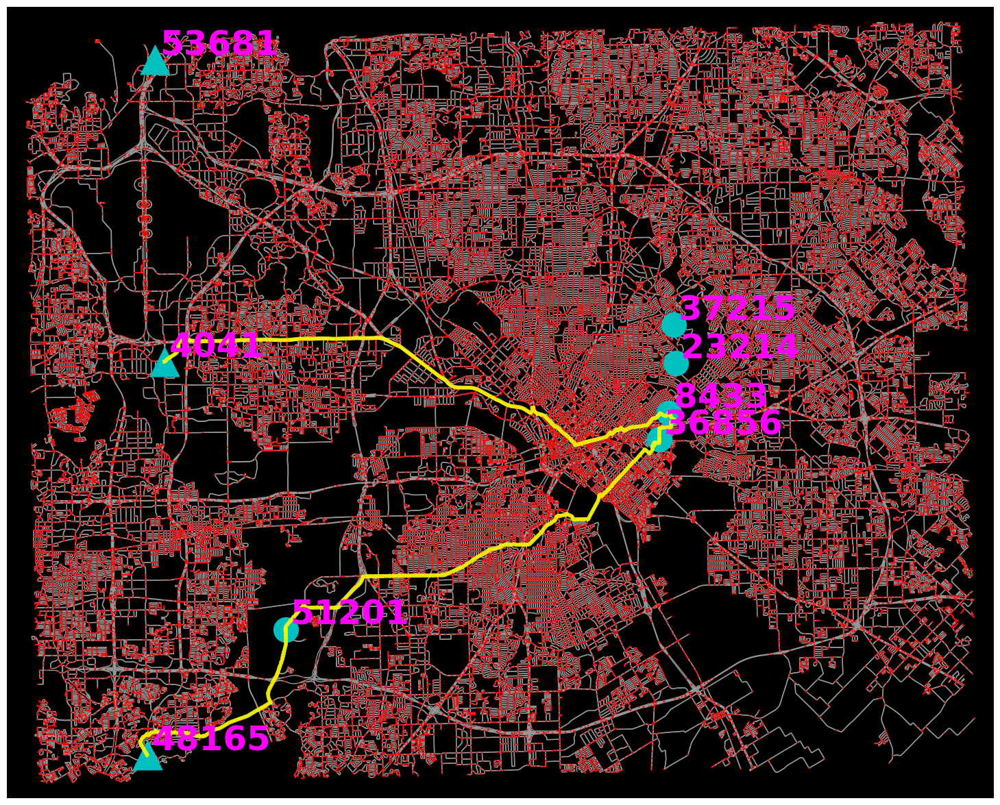



Repair demand at       37215 :  6
Repair_t (sec) at      37215 :  5.662740567399965
Power_restored (W) at  37215 :  78.42999999999999

Repair demand at       23214 :  1
Repair_t (sec) at      23214 :  5.936023519282912
Power_restored (W) at  23214 :  302.1699999999999

Repair demand at       8433 :  4
Repair_t (sec) at      8433 :  2.9488988148872295
Power_restored (W) at  8433 :  10476.660000000003

Repair demand at       36856 :  4
Repair_t (sec) at      36856 :  4.617479863369681
Power_restored (W) at  36856 :  10764.300000000003

Repair demand at       51201 :  8
Repair_t (sec) at      51201 :  5.899109705537398
Power_restored (W) at  51201 :  10773.170000000002

q_rem:   {37215: 6.0, 23214: 1.0, 8433: 0.0, 36856: 0.0, 51201: 1.0}
q_temp:  {37215: 6.0, 23214: 1.0, 8433: 0.0, 36856: 0.0, 51201: 1.0, 53681: 0, 4041: 0, 48165: 0}



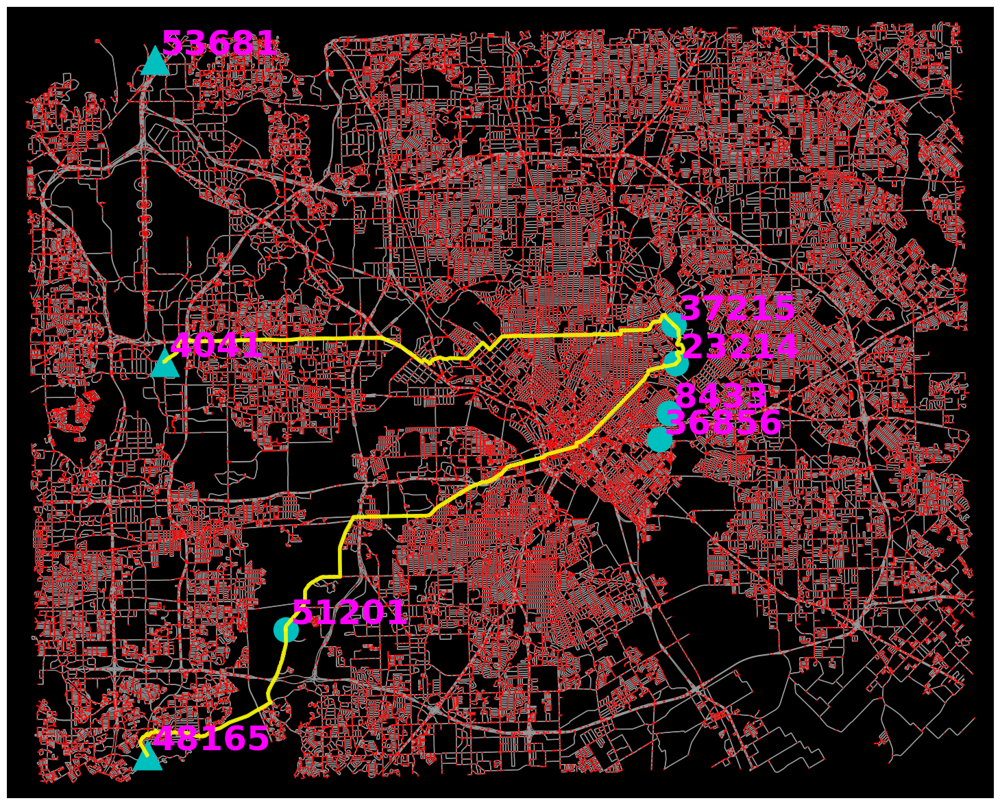


Total time spent in optimization:  32.30207419395447


In [20]:
start = time.time()

q_rem = q.copy()

itr = 0

while any(value > 0 for value in q_rem.values()):

    itr += 1
    
    q_temp = Resource_allocation(N, q_rem, Q, Repair_time_dict_RA, Power_restored_dict_RA)
    active_arcs = CVRP(B, N, V, q_temp, q, Q, Repair_time_dict, Power_restored_dict)
    
    print("q_rem:  ", q_rem)
    print("q_temp: ", q_temp)
    
    for key, value in q_rem.items():
        q_rem[key] = q_rem[key] - q_temp[key]
    
    print()
    
    routes_plot_func(nodes_list, shortest_path_routes, active_arcs, itr)

end = time.time()
print()
print("Total time spent in optimization: ", end - start)